In [44]:
import numpy as np
import scipy.sparse.linalg as splinalg
from scipy import interpolate
import matplotlib.pyplot as plt


from tqdm import tqdm

In [45]:
import cmasher as cmr

In [46]:
DOMAIN_SIZE = 1.0
N_POINTS = 41
N_TIME_STEPS = 100
TIME_STEP_LENGTH=0.1
KINEMATIC_VISCOSITY = 0.001
MAX_ITER_CG = None

In [47]:
def forcing_function(time, point):
  time_decay = np.maximum(
      2.0 - 0.5 * time,
      0.0,
  )

  forced_value = (
      time_decay *
      np.where (
          (
              (point[0] > 0.4) #point[0] = x, and point[1] = y
              &
              (point[0] < 0.6)
              &
              (point[1] > 0.1)
              &
              (point[1] < 0.3)
          ),
          np.array([0.0, 1.0]), #upward forcing
          np.array( [0.0, 0.0] ) # this would be no forcing if not in grid
      )
  )

  return forced_value

In [48]:
def main():
    element_length = DOMAIN_SIZE / (N_POINTS - 1)
    scalar_shape = (N_POINTS, N_POINTS)
    scalar_dof = N_POINTS**2
    vector_shape = (N_POINTS, N_POINTS, 2)
    vector_dof = N_POINTS**2 * 2

    x = np.linspace(0.0, DOMAIN_SIZE, N_POINTS)
    y = np.linspace(0.0, DOMAIN_SIZE, N_POINTS)

    # Using "ij" indexing makes the differential operators more logical. Note when plotting
    X, Y = np.meshgrid(x, y, indexing="ij")

    coordinates = np.concatenate(
        (
            X[..., np.newaxis],
            Y[..., np.newaxis],
        ),
        axis=-1,
    )

    forcing_function_vectorized = np.vectorize(
        pyfunc=forcing_function,
        signature="(),(d)->(d)",
    )

    def partial_derivative_x(field):
        diff = np.zeros_like(field)

        diff[1:-1, 1:-1] = (
            (
                field[2:  , 1:-1]
                -
                field[0:-2, 1:-1]
            ) / (
                2 * element_length
            )
        )

        return diff

    def partial_derivative_y(field):
        diff = np.zeros_like(field)

        diff[1:-1, 1:-1] = (
            (
                field[1:-1, 2:  ]
                -
                field[1:-1, 0:-2]
            ) / (
                2 * element_length
            )
        )

        return diff

    def laplace(field):
        diff = np.zeros_like(field)

        diff[1:-1, 1:-1] = (
            (
                field[0:-2, 1:-1]
                +
                field[1:-1, 0:-2]
                - 4 *
                field[1:-1, 1:-1]
                +
                field[2:  , 1:-1]
                +
                field[1:-1, 2:  ]
            ) / (
                element_length**2
            )
        )

        return diff

    def divergence(vector_field):
        divergence_applied = (
            partial_derivative_x(vector_field[..., 0])
            +
            partial_derivative_y(vector_field[..., 1])
        )

        return divergence_applied

    def gradient(field):
        gradient_applied = np.concatenate(
            (
                partial_derivative_x(field)[..., np.newaxis],
                partial_derivative_y(field)[..., np.newaxis],
            ),
            axis=-1,
        )

        return gradient_applied

    def curl_2d(vector_field):
        curl_applied = (
            partial_derivative_x(vector_field[..., 1])
            -
            partial_derivative_y(vector_field[..., 0])
        )

        return curl_applied

    def advect(field, vector_field):
        backtraced_positions = np.clip( #only one euler step
            (
                coordinates
                -
                TIME_STEP_LENGTH
                *
                vector_field
            ),
            0.0,
            DOMAIN_SIZE,
        )

        advected_field = interpolate.interpn(
            points=(x, y),
            values=field,
            xi=backtraced_positions,
        )

        return advected_field

    def diffusion_operator(vector_field_flattened):
        vector_field = vector_field_flattened.reshape(vector_shape)

        diffusion_applied = (
            vector_field
            -
            KINEMATIC_VISCOSITY
            *
            TIME_STEP_LENGTH
            *
            laplace(vector_field)
        )

        return diffusion_applied.flatten()

    def poisson_operator(field_flattened):
        field = field_flattened.reshape(scalar_shape)

        poisson_applied = laplace(field)

        return poisson_applied.flatten()

    plt.style.use("dark_background")
    plt.figure(figsize=(5, 5), dpi=160)

    velocities_prev = np.zeros(vector_shape)

    time_current = 0.0
    for i in tqdm(range(N_TIME_STEPS)):
        time_current += TIME_STEP_LENGTH

        forces = forcing_function_vectorized(
            time_current,
            coordinates,
        )

        # 1 Apply Forces
        velocities_forces_applied = (
            velocities_prev
            +
            TIME_STEP_LENGTH
            *
            forces
        )

        # 2  Nonlinear convection (=self)
        velocities_advected = advect(
            field=velocities_forces_applied,
            vector_field=velocities_forces_applied,
        )

        # 3  Diffuse
        velocities_diffused = splinalg.cg(
            A=splinalg.LinearOperator(
                shape=(vector_dof, vector_dof),
                matvec=diffusion_operator,
            ),
            b=velocities_advected.flatten(),
            maxiter=MAX_ITER_CG,
        )[0].reshape(vector_shape)

        # 4-a Compute a pressure correction with Poisson Operator
        pressure = splinalg.cg(
            A=splinalg.LinearOperator(
                shape=(scalar_dof, scalar_dof),
                matvec=poisson_operator,
            ),
            b=divergence(velocities_diffused).flatten(),
            maxiter=MAX_ITER_CG,
        )[0].reshape(scalar_shape)

        # 4-b Correct the velocities to be incompressible
        velocities_projected = (
            velocities_diffused
            -
            gradient(pressure)
        )


        velocities_prev = velocities_projected


        curl = curl_2d(velocities_projected)
        plt.contourf(
            X,
            Y,
            curl,
            cmap=cmr.redshift,
            levels=100,
        )
        plt.quiver(
            X,
            Y,
            velocities_projected[..., 0],
            velocities_projected[..., 1],
            color="dimgray",
        )
        plt.draw()
        plt.pause(0.0001)
        plt.clf()

    plt.show()








  0%|          | 0/100 [00:00<?, ?it/s]

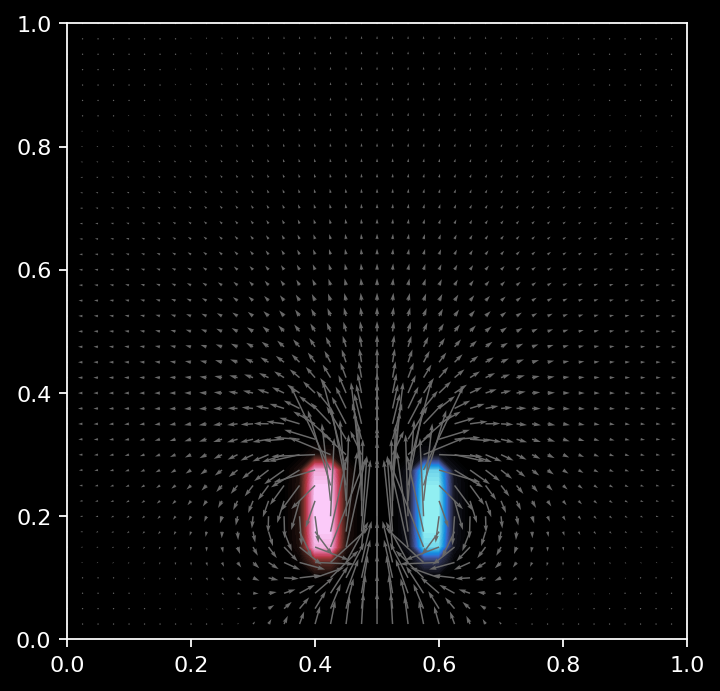

  1%|          | 1/100 [00:00<01:19,  1.25it/s]

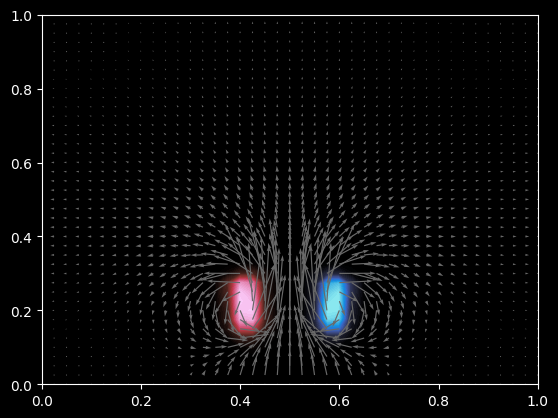

  2%|▏         | 2/100 [00:01<01:01,  1.61it/s]

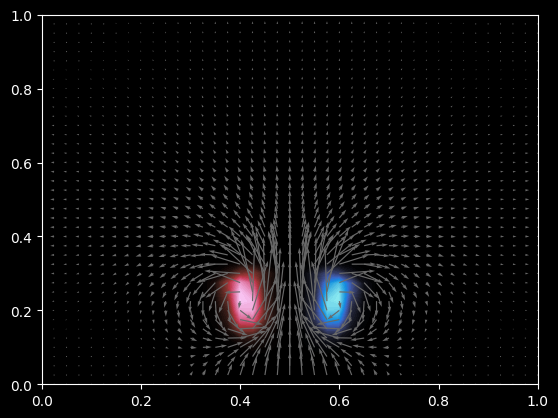

  3%|▎         | 3/100 [00:01<00:53,  1.82it/s]

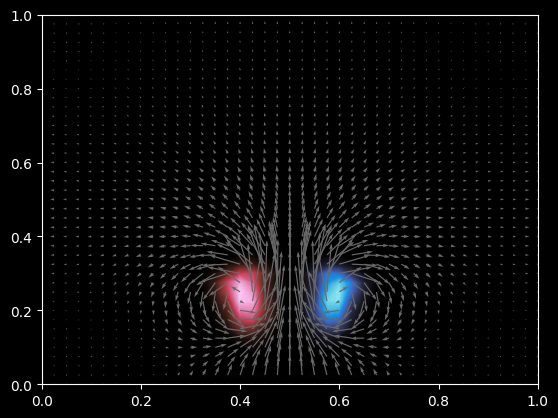

  4%|▍         | 4/100 [00:02<00:51,  1.88it/s]

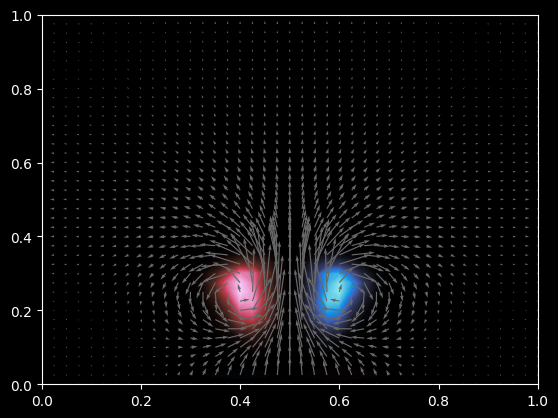

  5%|▌         | 5/100 [00:03<01:05,  1.46it/s]

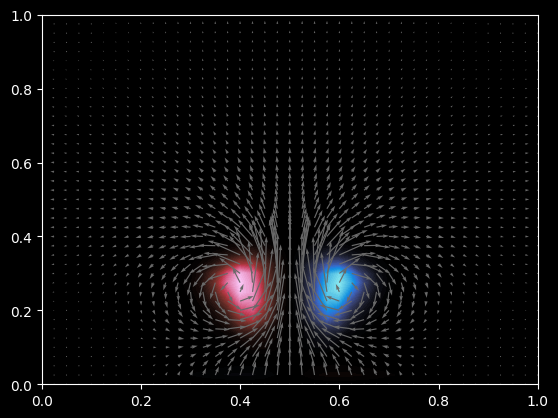

  6%|▌         | 6/100 [00:04<01:10,  1.34it/s]

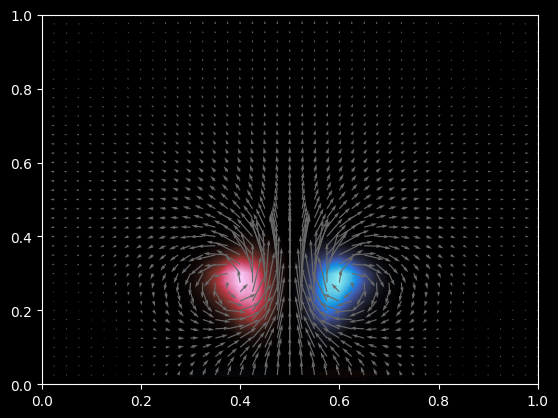

  7%|▋         | 7/100 [00:05<01:24,  1.10it/s]

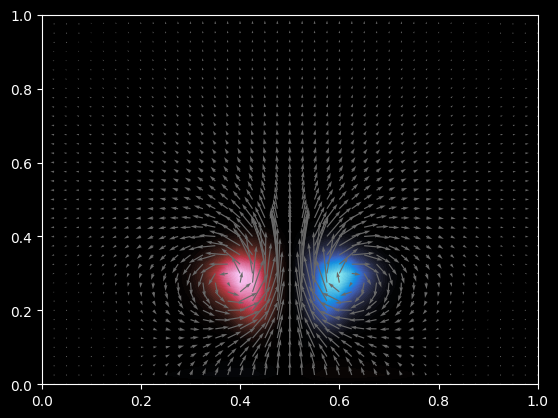

  8%|▊         | 8/100 [00:06<01:34,  1.03s/it]

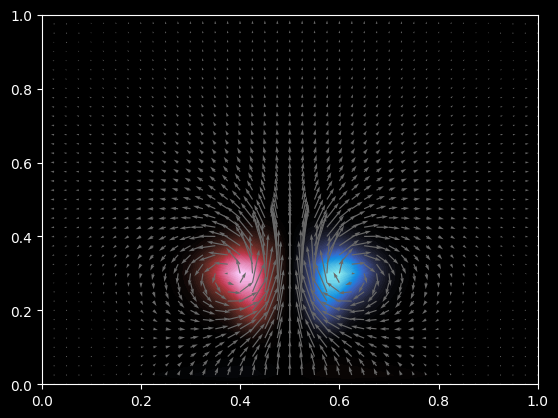

  9%|▉         | 9/100 [00:08<02:11,  1.45s/it]

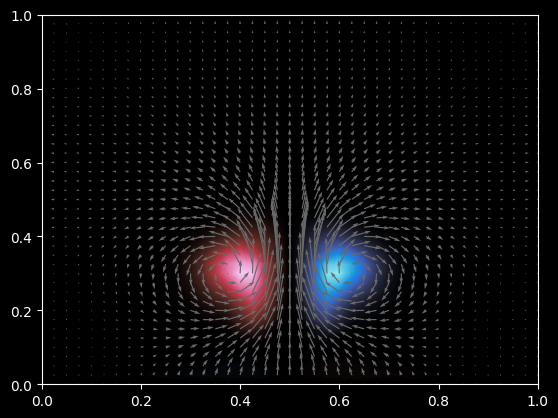

 10%|█         | 10/100 [00:10<02:06,  1.41s/it]

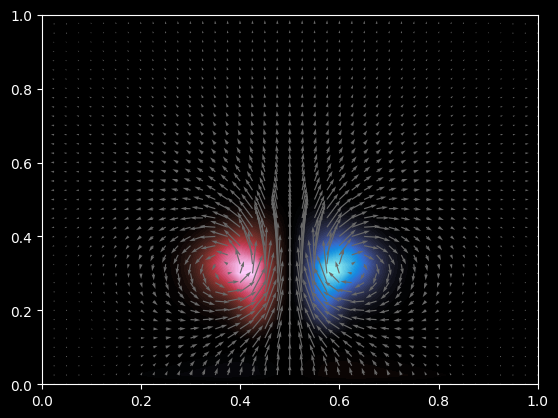

 11%|█         | 11/100 [00:11<01:49,  1.23s/it]

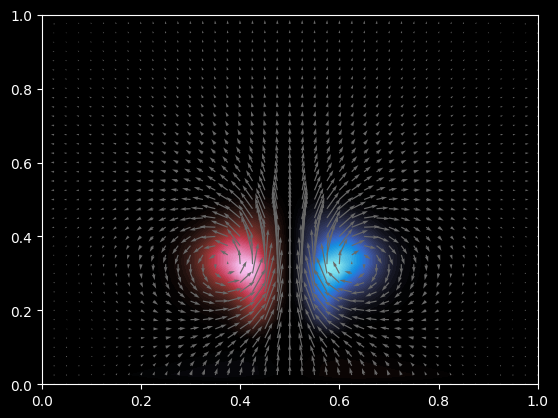

 12%|█▏        | 12/100 [00:12<01:40,  1.14s/it]

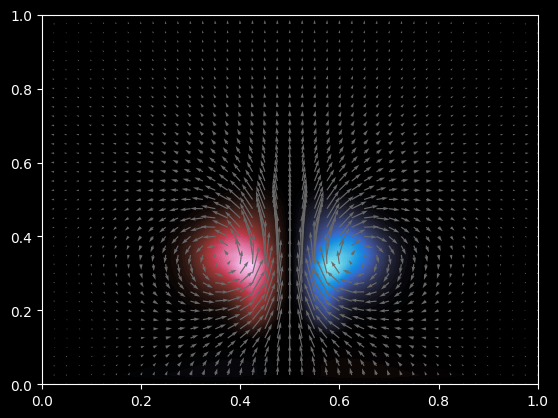

 13%|█▎        | 13/100 [00:13<01:45,  1.21s/it]

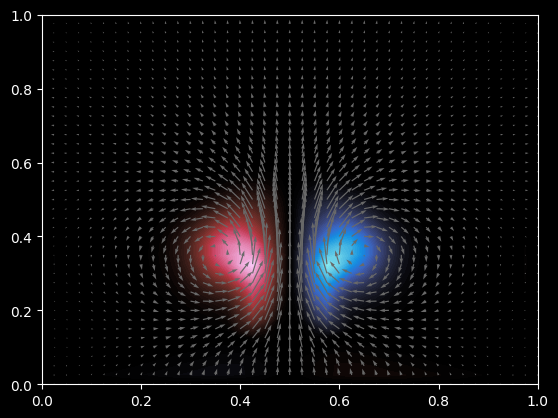

 14%|█▍        | 14/100 [00:13<01:26,  1.00s/it]

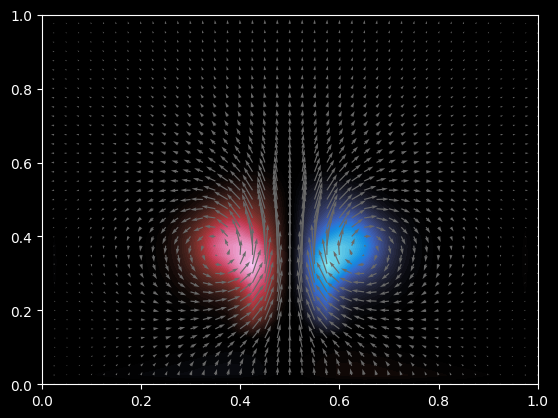

 15%|█▌        | 15/100 [00:14<01:12,  1.16it/s]

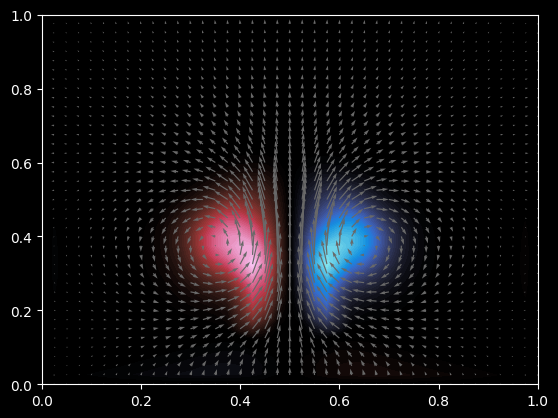

 16%|█▌        | 16/100 [00:14<01:03,  1.33it/s]

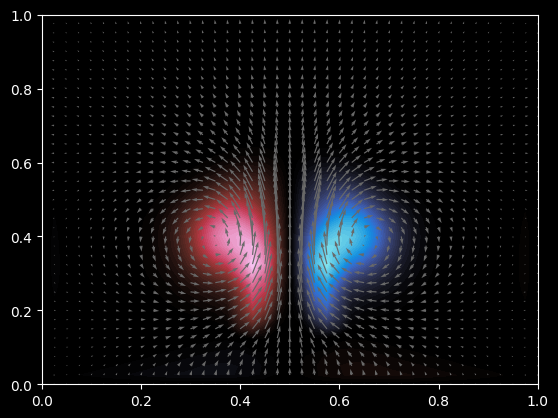

 17%|█▋        | 17/100 [00:15<01:00,  1.38it/s]

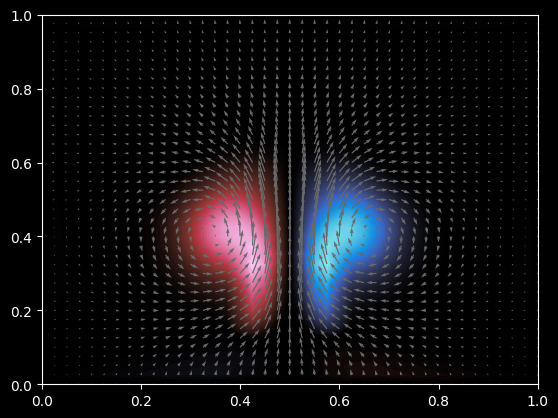

 18%|█▊        | 18/100 [00:16<00:54,  1.51it/s]

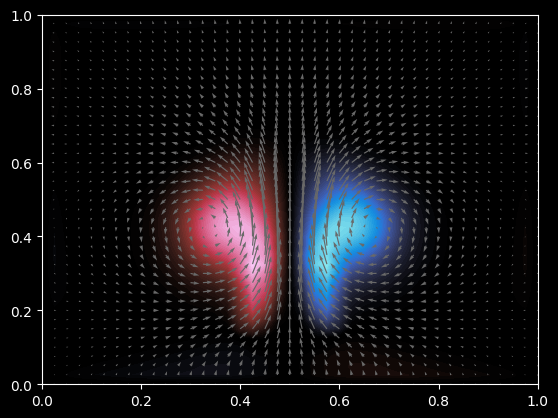

 19%|█▉        | 19/100 [00:16<00:50,  1.60it/s]

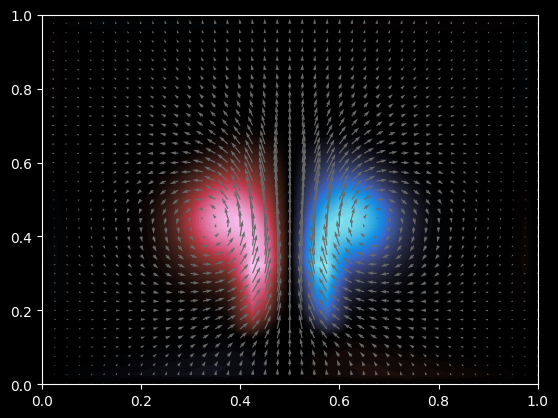

 20%|██        | 20/100 [00:17<00:46,  1.71it/s]

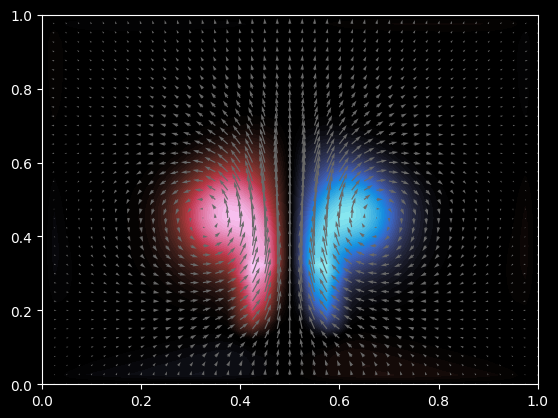

 21%|██        | 21/100 [00:17<00:48,  1.64it/s]

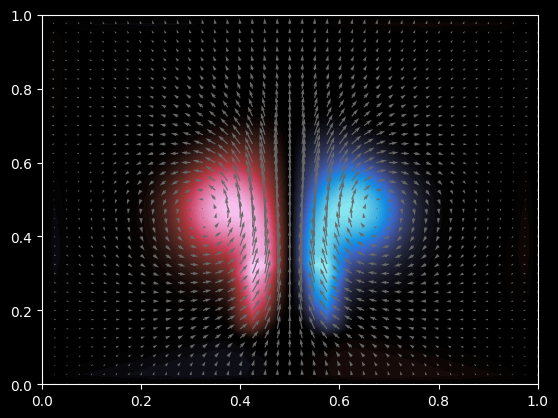

 22%|██▏       | 22/100 [00:18<00:45,  1.73it/s]

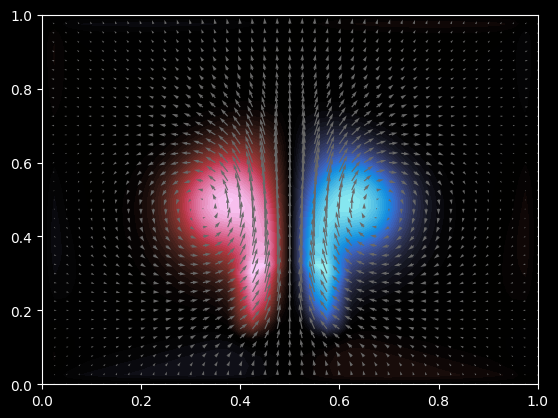

 23%|██▎       | 23/100 [00:18<00:43,  1.78it/s]

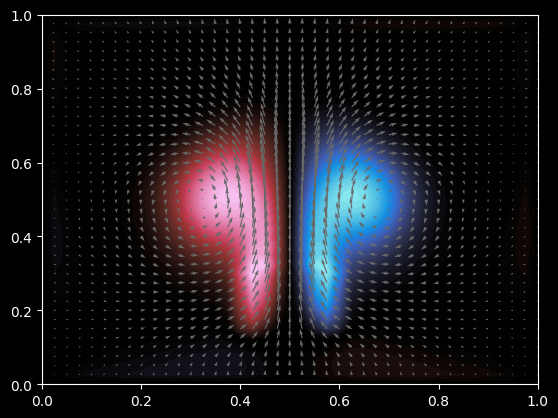

 24%|██▍       | 24/100 [00:19<00:42,  1.79it/s]

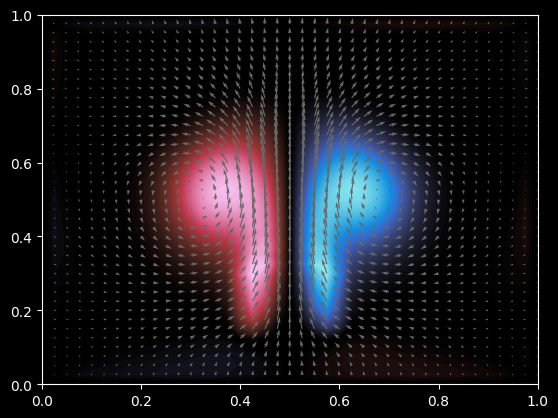

 25%|██▌       | 25/100 [00:20<00:46,  1.61it/s]

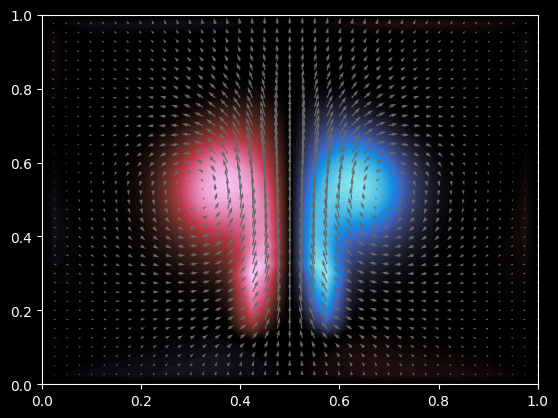

 26%|██▌       | 26/100 [00:21<00:54,  1.37it/s]

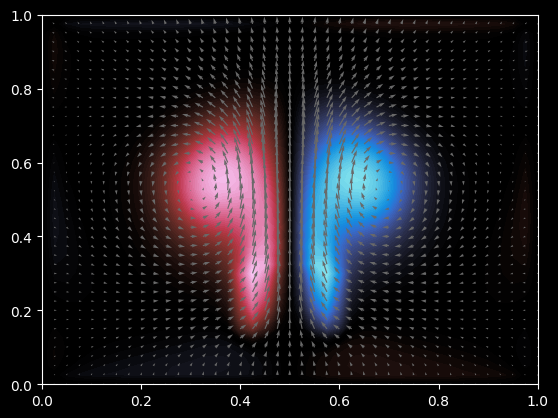

 27%|██▋       | 27/100 [00:22<00:55,  1.31it/s]

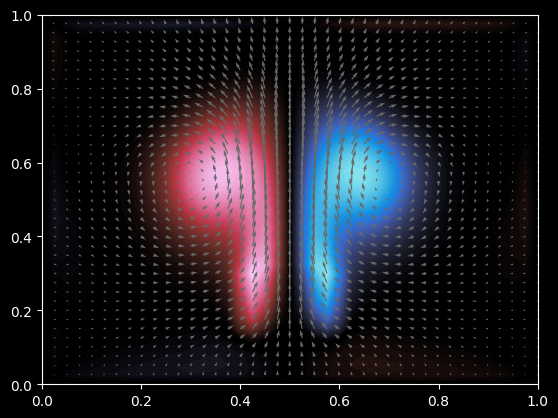

 28%|██▊       | 28/100 [00:22<00:56,  1.28it/s]

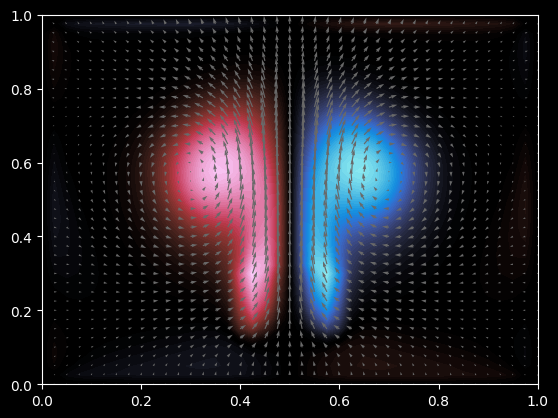

 29%|██▉       | 29/100 [00:23<00:56,  1.26it/s]

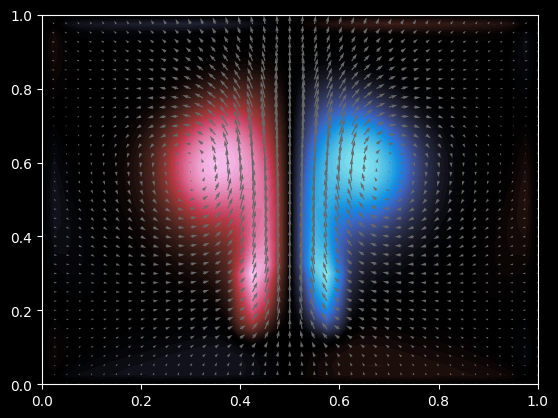

 30%|███       | 30/100 [00:24<00:50,  1.39it/s]

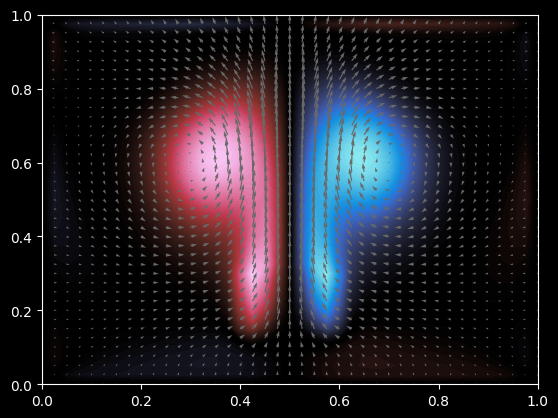

 31%|███       | 31/100 [00:24<00:46,  1.48it/s]

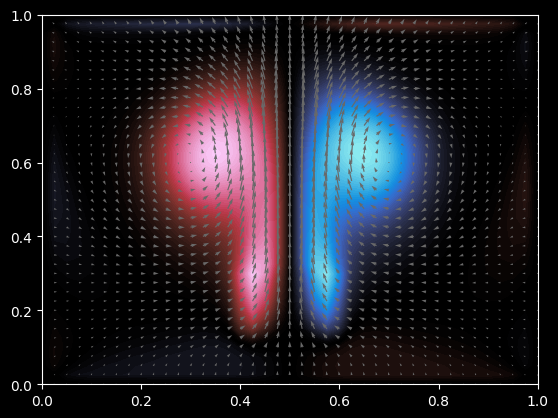

 32%|███▏      | 32/100 [00:25<00:44,  1.54it/s]

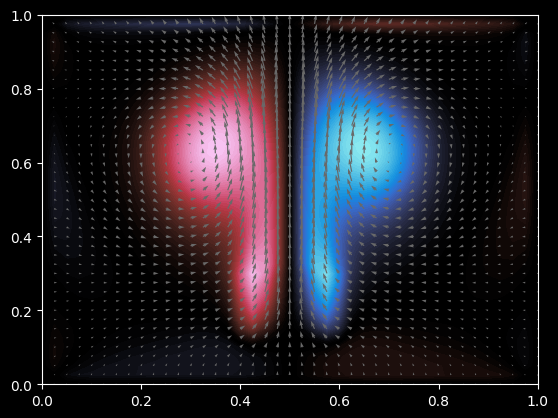

 33%|███▎      | 33/100 [00:26<00:44,  1.49it/s]

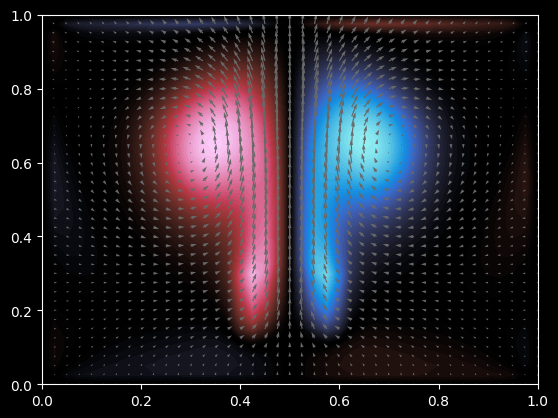

 34%|███▍      | 34/100 [00:26<00:42,  1.54it/s]

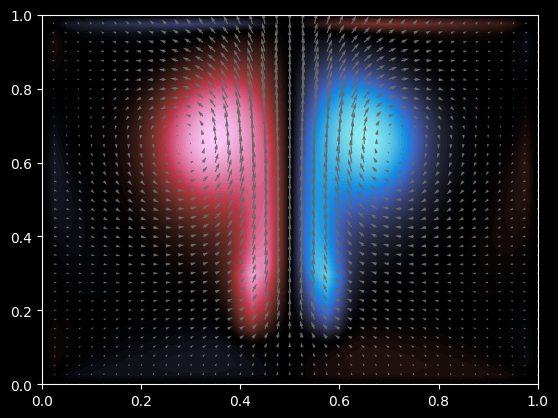

 35%|███▌      | 35/100 [00:27<00:40,  1.60it/s]

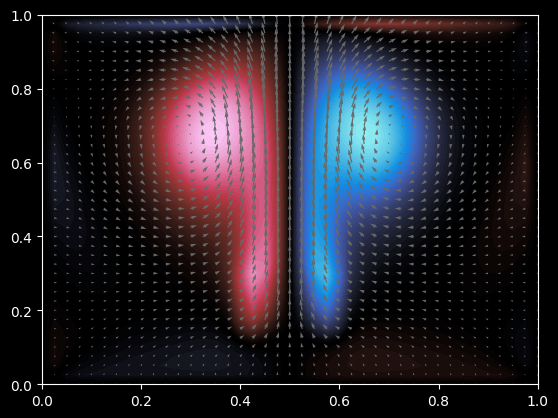

 36%|███▌      | 36/100 [00:27<00:39,  1.64it/s]

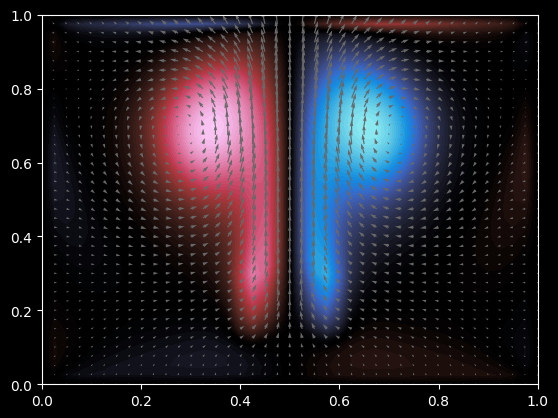

 37%|███▋      | 37/100 [00:28<00:42,  1.50it/s]

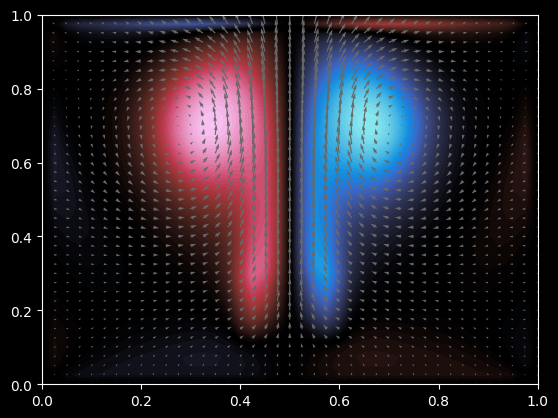

 38%|███▊      | 38/100 [00:29<00:39,  1.57it/s]

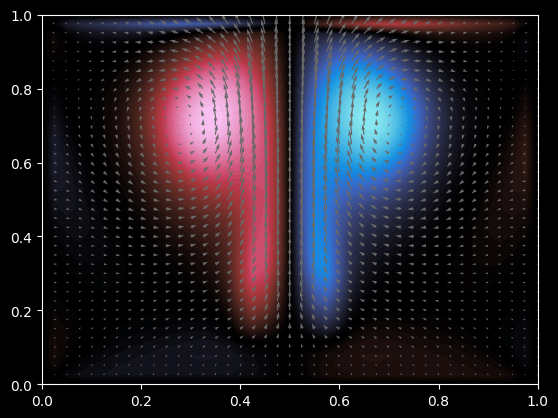

 39%|███▉      | 39/100 [00:29<00:37,  1.61it/s]

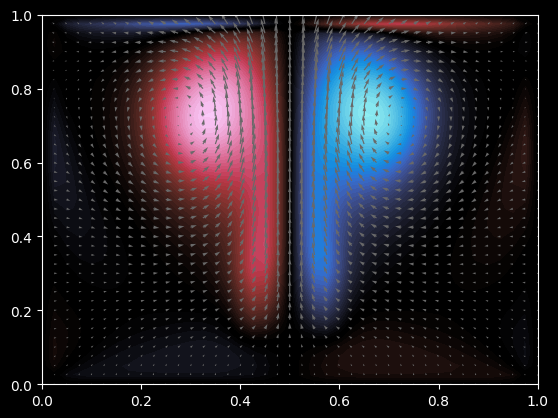

 40%|████      | 40/100 [00:30<00:36,  1.62it/s]

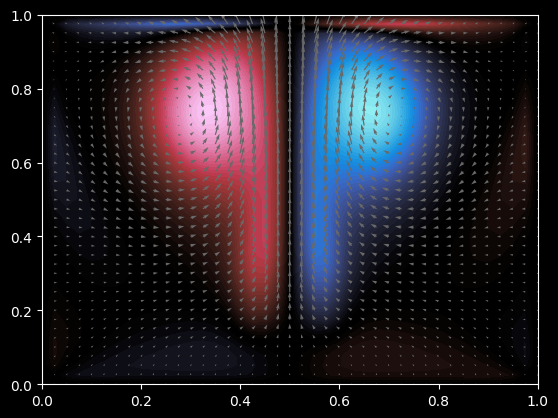

 41%|████      | 41/100 [00:30<00:35,  1.67it/s]

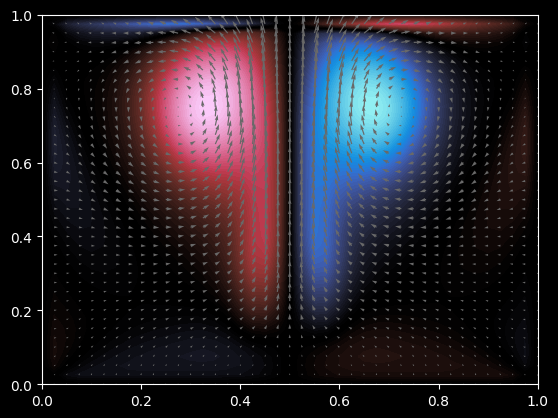

 42%|████▏     | 42/100 [00:31<00:37,  1.55it/s]

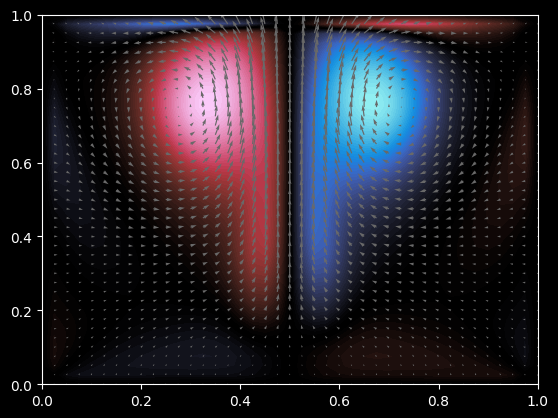

 43%|████▎     | 43/100 [00:32<00:35,  1.59it/s]

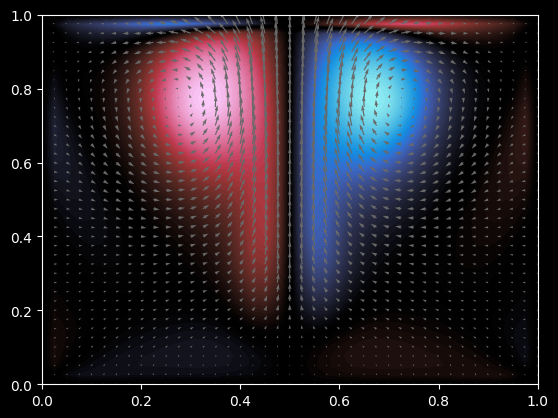

 44%|████▍     | 44/100 [00:32<00:35,  1.59it/s]

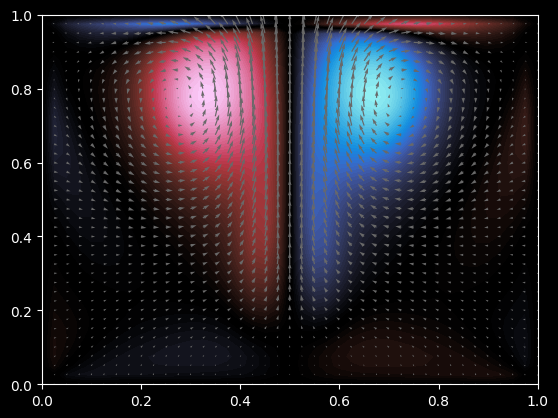

 45%|████▌     | 45/100 [00:33<00:35,  1.55it/s]

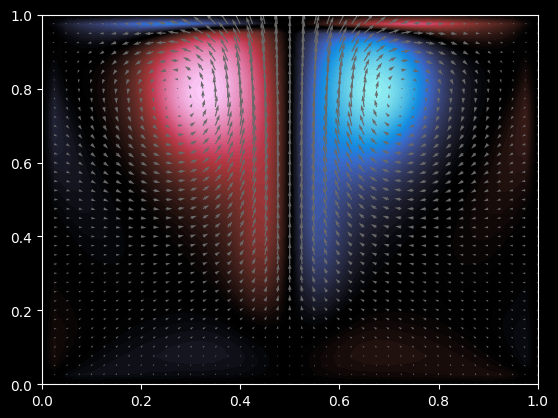

 46%|████▌     | 46/100 [00:34<00:42,  1.28it/s]

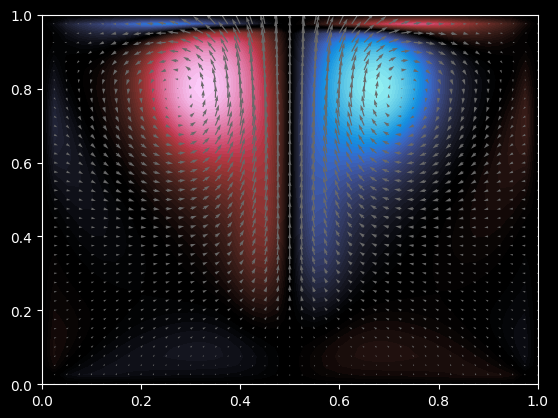

 47%|████▋     | 47/100 [00:35<00:41,  1.29it/s]

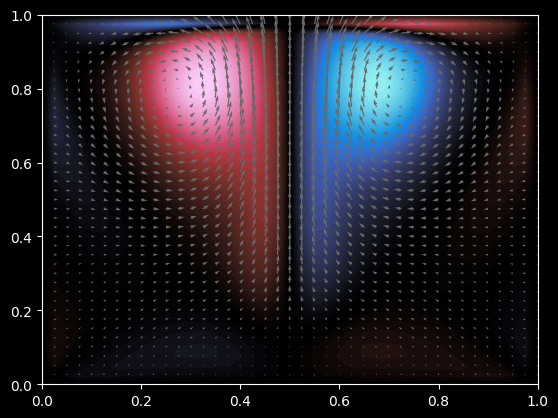

 48%|████▊     | 48/100 [00:36<00:41,  1.26it/s]

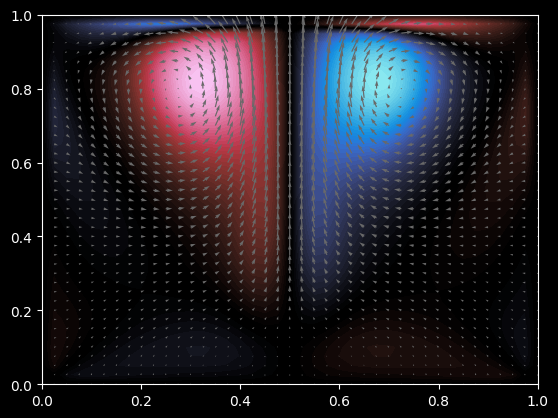

 49%|████▉     | 49/100 [00:37<00:39,  1.28it/s]

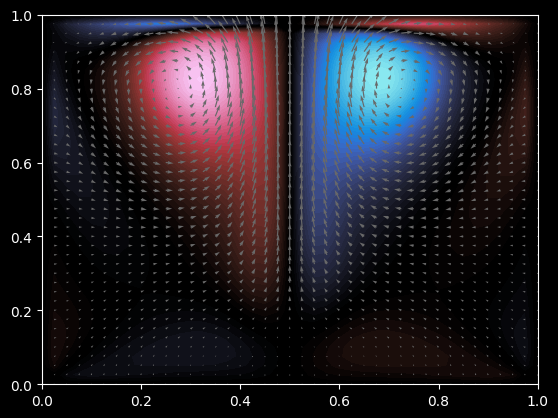

 50%|█████     | 50/100 [00:38<00:42,  1.18it/s]

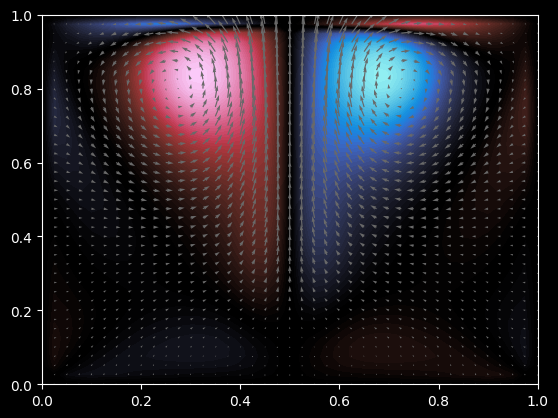

 51%|█████     | 51/100 [00:38<00:37,  1.30it/s]

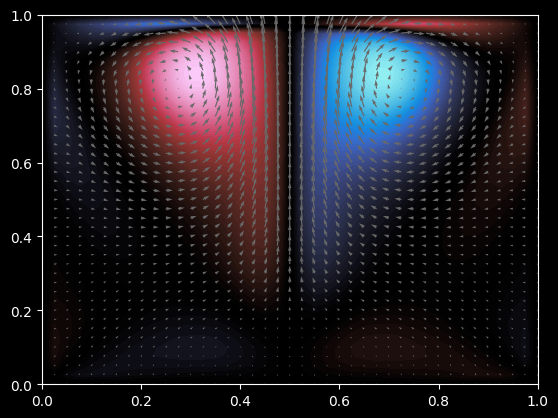

 52%|█████▏    | 52/100 [00:39<00:35,  1.35it/s]

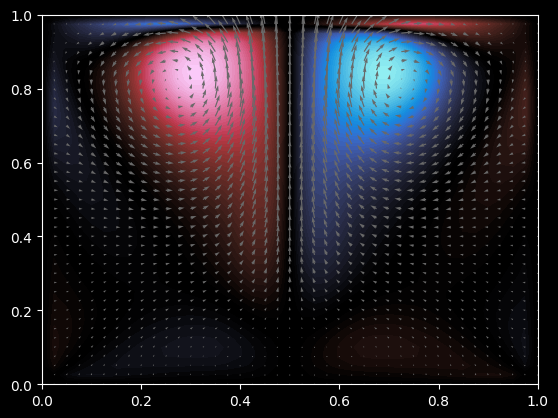

 53%|█████▎    | 53/100 [00:39<00:33,  1.41it/s]

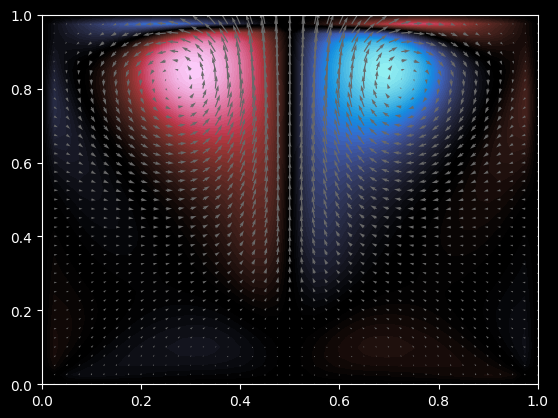

 54%|█████▍    | 54/100 [00:40<00:33,  1.37it/s]

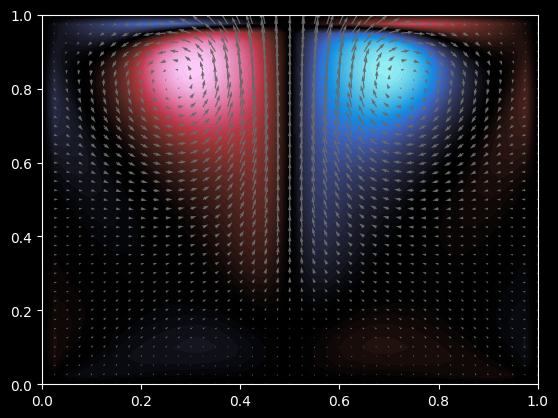

 55%|█████▌    | 55/100 [00:41<00:31,  1.44it/s]

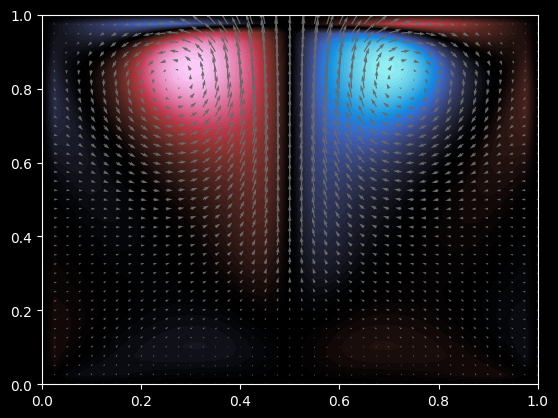

 56%|█████▌    | 56/100 [00:41<00:29,  1.48it/s]

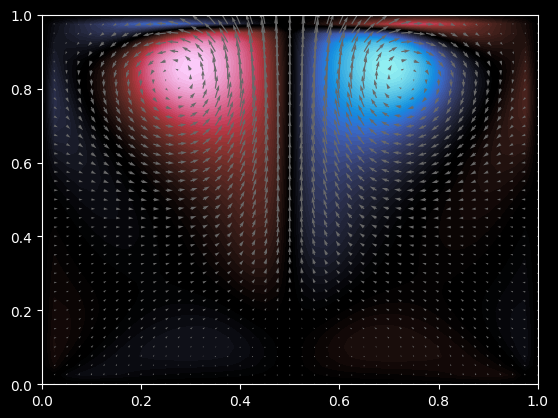

 57%|█████▋    | 57/100 [00:42<00:29,  1.48it/s]

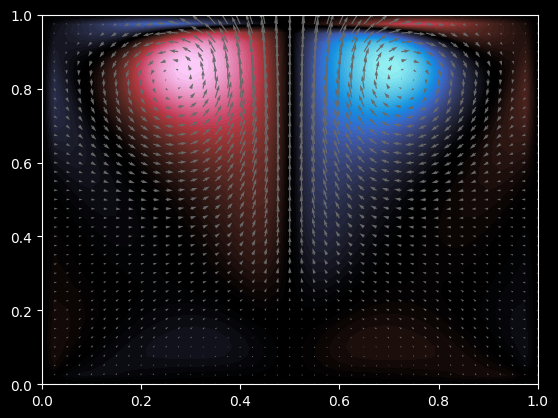

 58%|█████▊    | 58/100 [00:43<00:29,  1.43it/s]

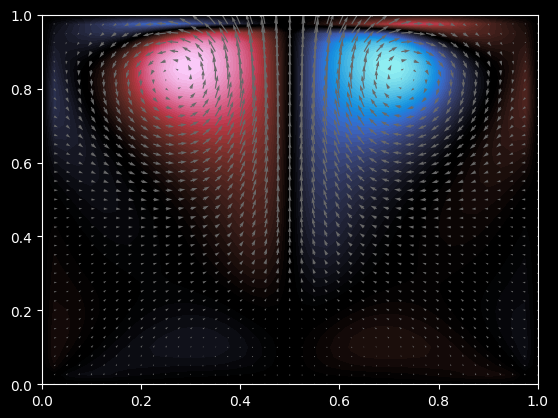

 59%|█████▉    | 59/100 [00:44<00:27,  1.48it/s]

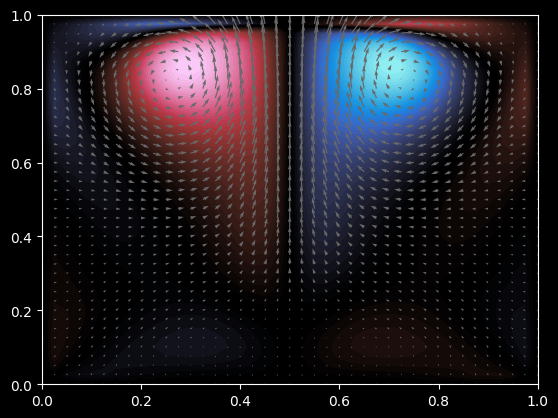

 60%|██████    | 60/100 [00:44<00:26,  1.51it/s]

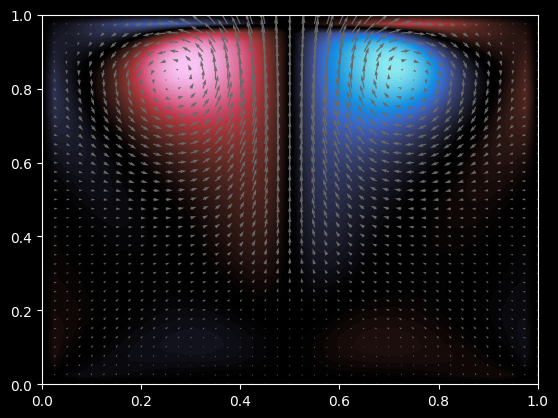

 61%|██████    | 61/100 [00:45<00:25,  1.55it/s]

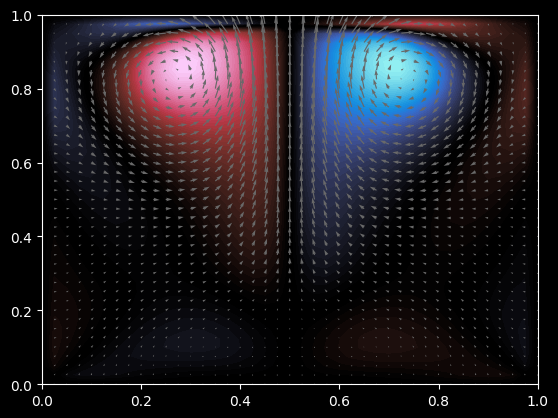

 62%|██████▏   | 62/100 [00:46<00:25,  1.47it/s]

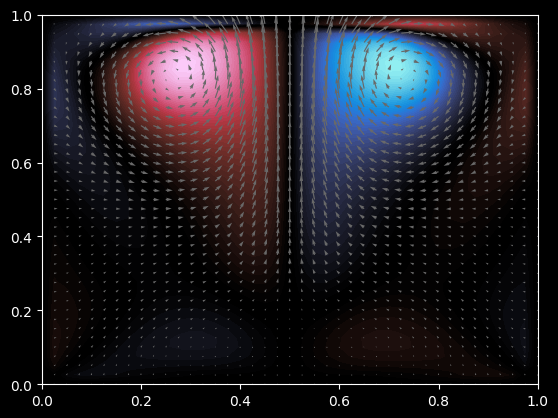

 63%|██████▎   | 63/100 [00:46<00:25,  1.48it/s]

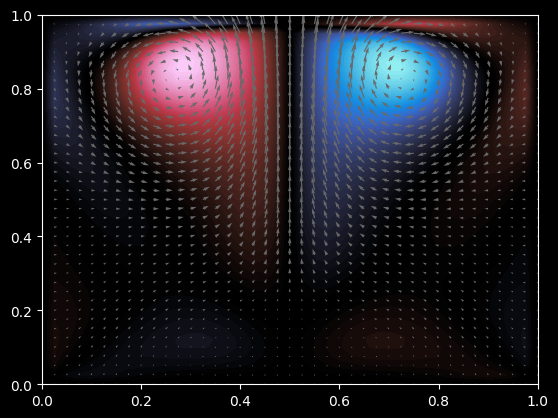

 64%|██████▍   | 64/100 [00:47<00:24,  1.45it/s]

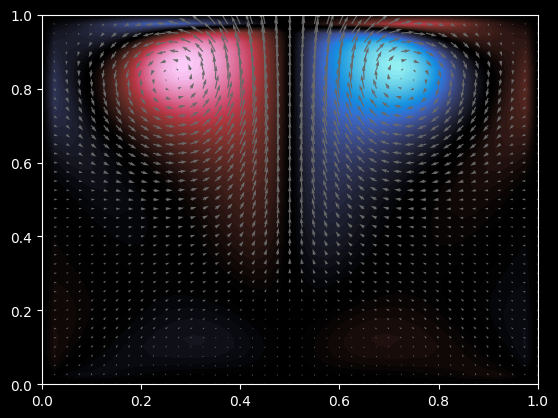

 65%|██████▌   | 65/100 [00:48<00:23,  1.48it/s]

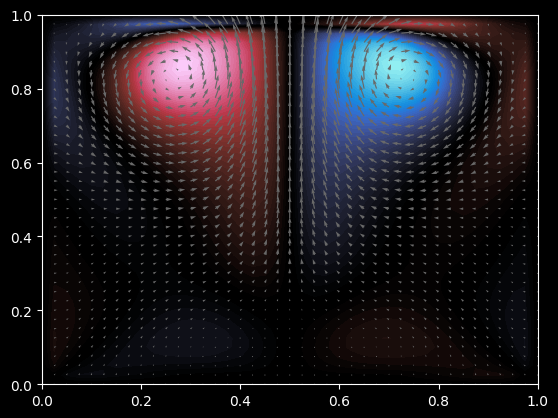

 66%|██████▌   | 66/100 [00:49<00:26,  1.28it/s]

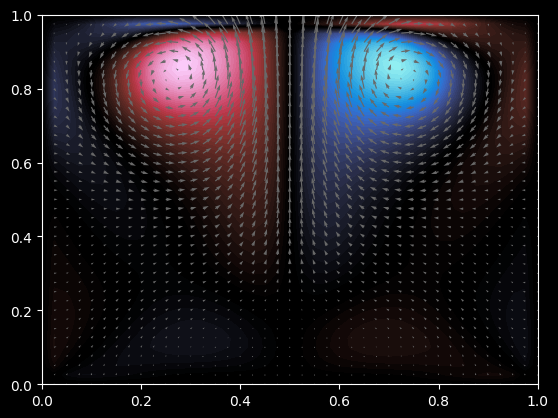

 67%|██████▋   | 67/100 [00:49<00:25,  1.27it/s]

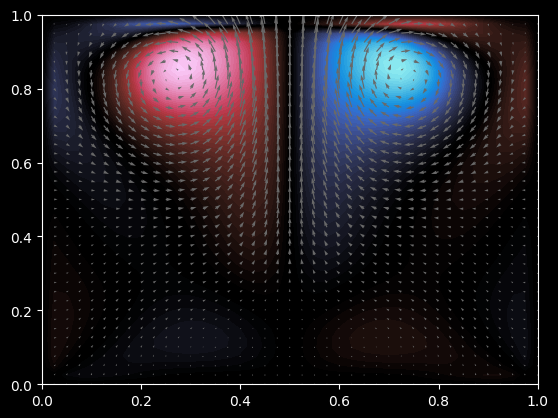

 68%|██████▊   | 68/100 [00:50<00:26,  1.23it/s]

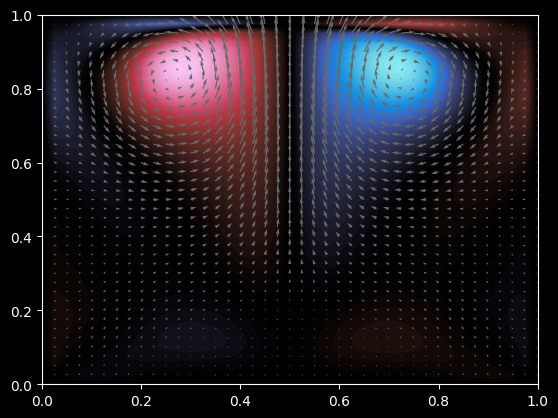

 69%|██████▉   | 69/100 [00:51<00:25,  1.19it/s]

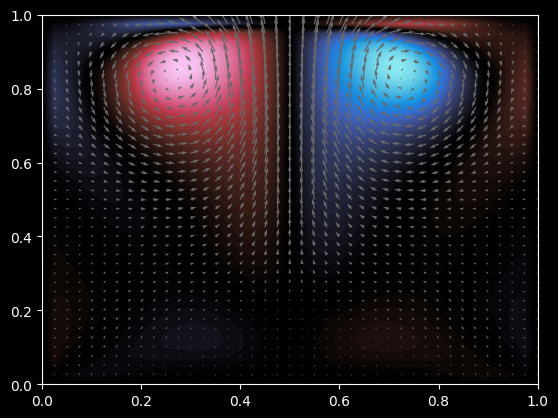

 70%|███████   | 70/100 [00:52<00:27,  1.10it/s]

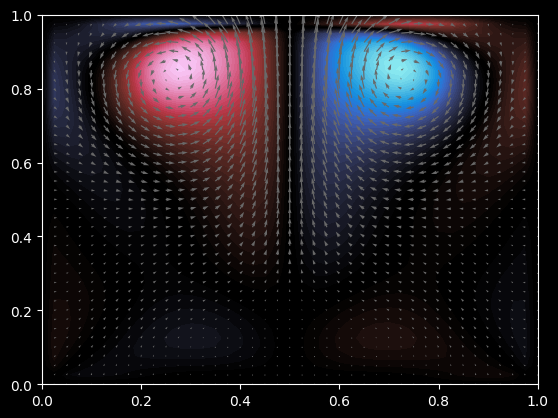

 71%|███████   | 71/100 [00:53<00:24,  1.20it/s]

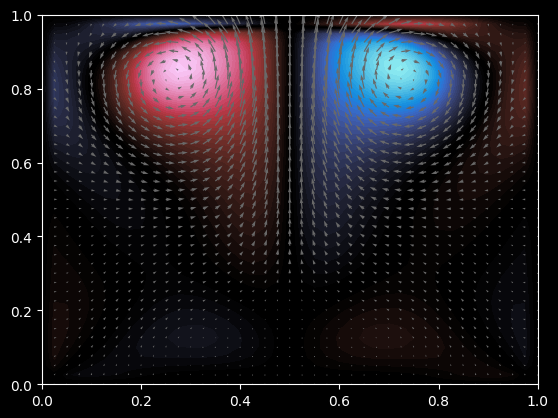

 72%|███████▏  | 72/100 [00:54<00:21,  1.31it/s]

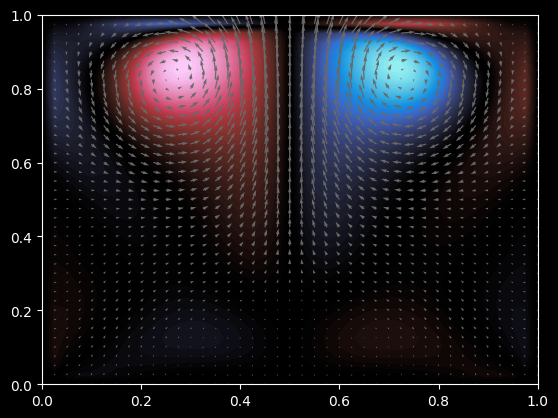

 73%|███████▎  | 73/100 [00:54<00:20,  1.35it/s]

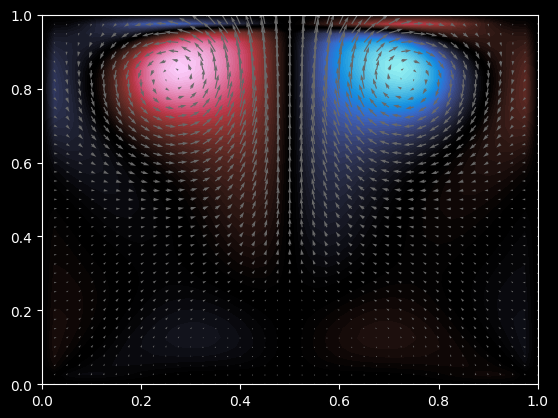

 74%|███████▍  | 74/100 [00:55<00:19,  1.32it/s]

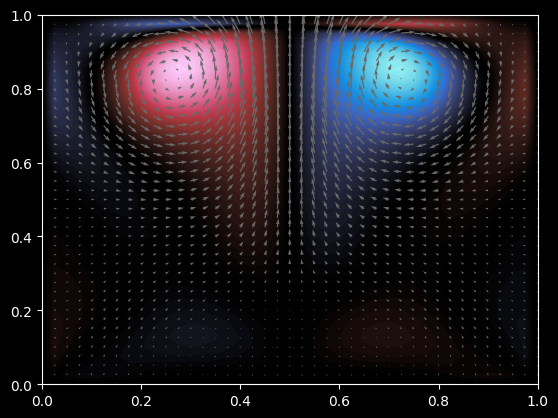

 75%|███████▌  | 75/100 [00:56<00:18,  1.36it/s]

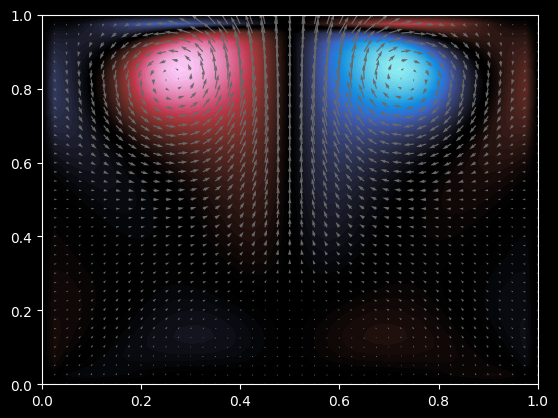

 76%|███████▌  | 76/100 [00:56<00:16,  1.42it/s]

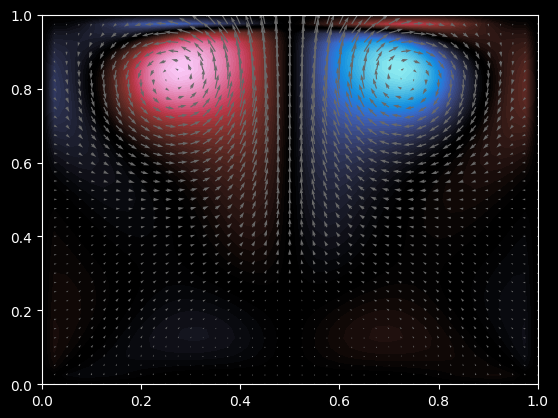

 77%|███████▋  | 77/100 [00:57<00:16,  1.42it/s]

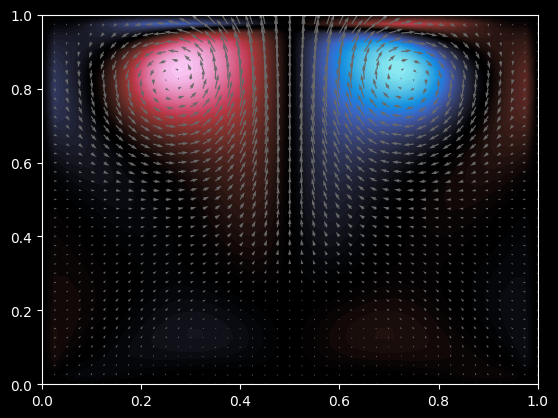

 78%|███████▊  | 78/100 [00:58<00:16,  1.36it/s]

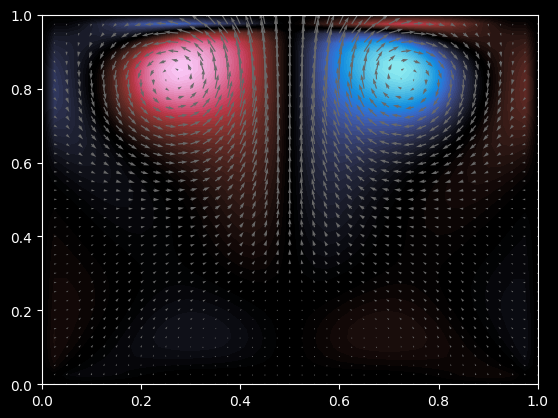

 79%|███████▉  | 79/100 [00:59<00:15,  1.38it/s]

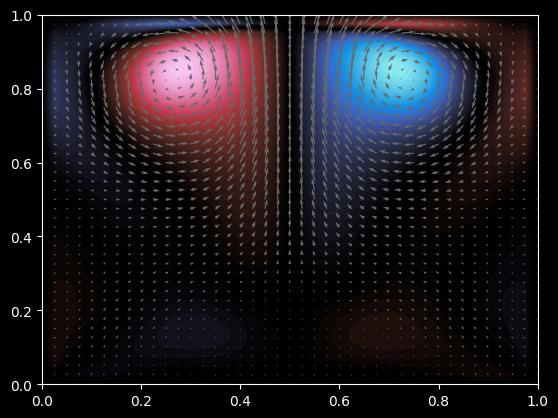

 80%|████████  | 80/100 [00:59<00:13,  1.43it/s]

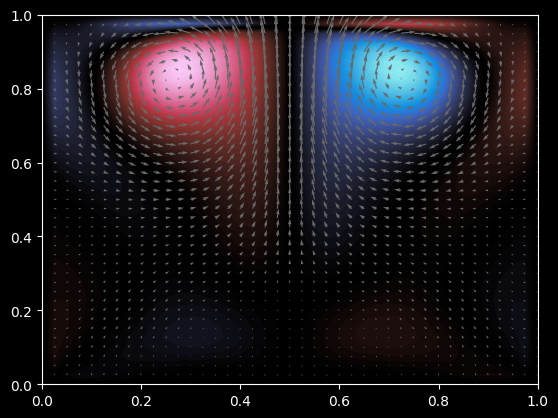

 81%|████████  | 81/100 [01:00<00:13,  1.42it/s]

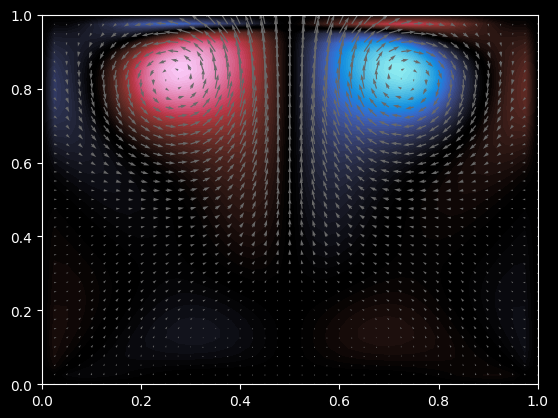

 82%|████████▏ | 82/100 [01:01<00:13,  1.37it/s]

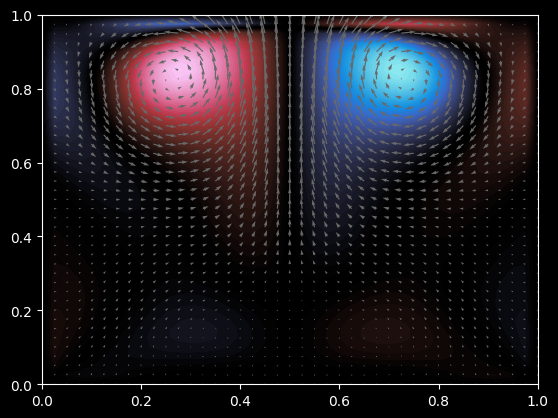

 83%|████████▎ | 83/100 [01:01<00:12,  1.41it/s]

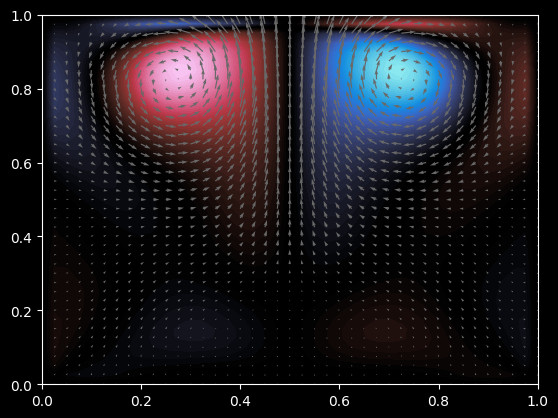

 84%|████████▍ | 84/100 [01:02<00:11,  1.40it/s]

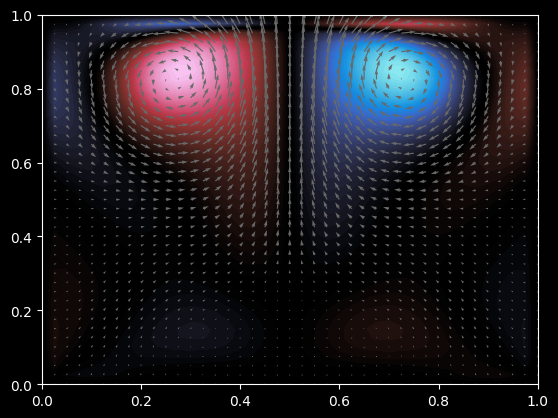

 85%|████████▌ | 85/100 [01:03<00:11,  1.34it/s]

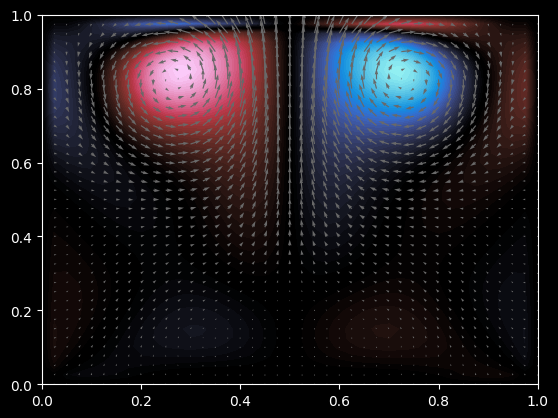

 86%|████████▌ | 86/100 [01:04<00:11,  1.18it/s]

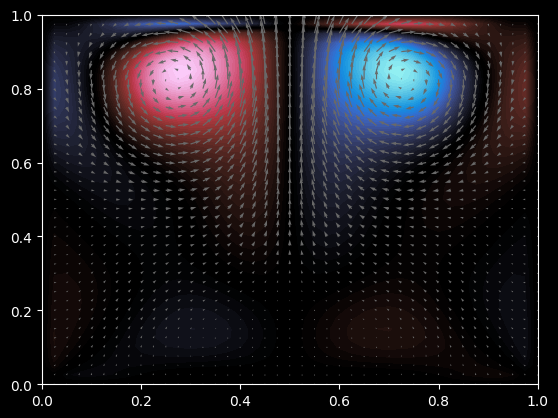

 87%|████████▋ | 87/100 [01:05<00:10,  1.19it/s]

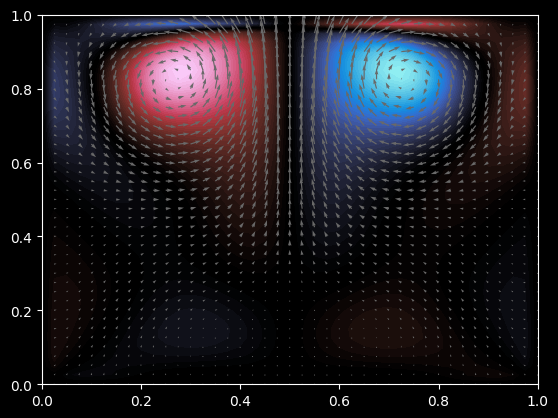

 88%|████████▊ | 88/100 [01:06<00:10,  1.16it/s]

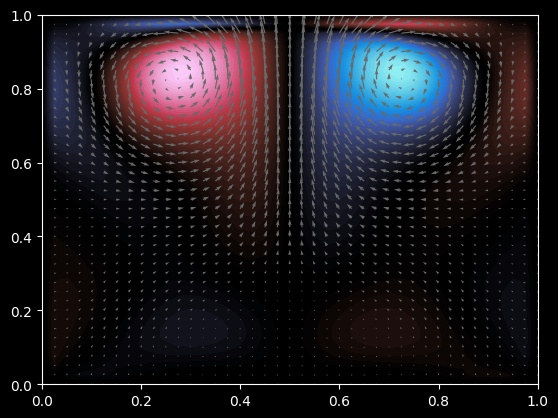

 89%|████████▉ | 89/100 [01:07<00:09,  1.17it/s]

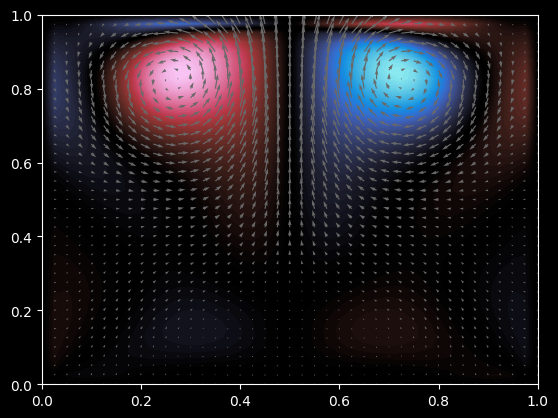

 90%|█████████ | 90/100 [01:08<00:09,  1.06it/s]

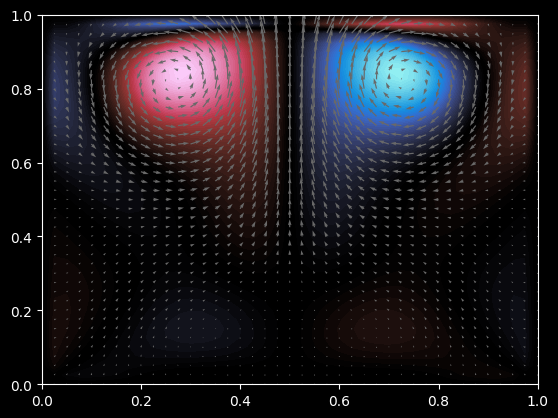

 91%|█████████ | 91/100 [01:08<00:07,  1.13it/s]

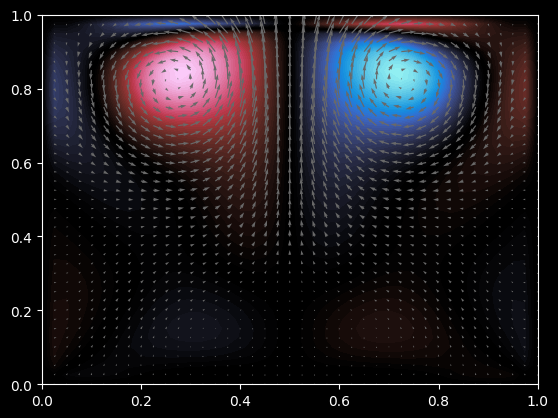

 92%|█████████▏| 92/100 [01:09<00:06,  1.18it/s]

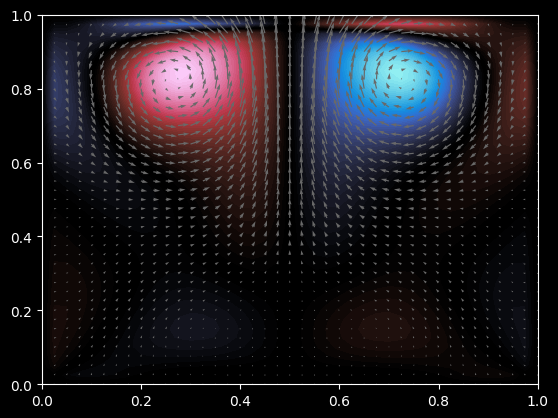

 93%|█████████▎| 93/100 [01:10<00:05,  1.24it/s]

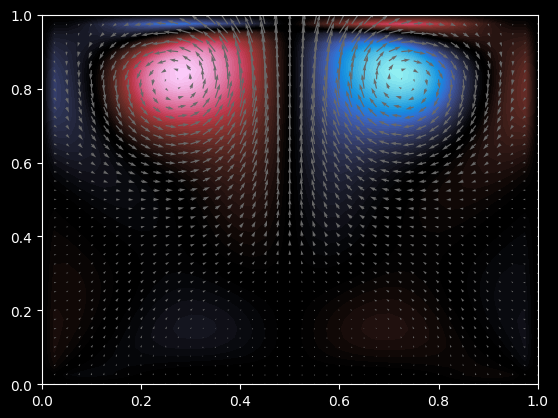

 94%|█████████▍| 94/100 [01:11<00:04,  1.22it/s]

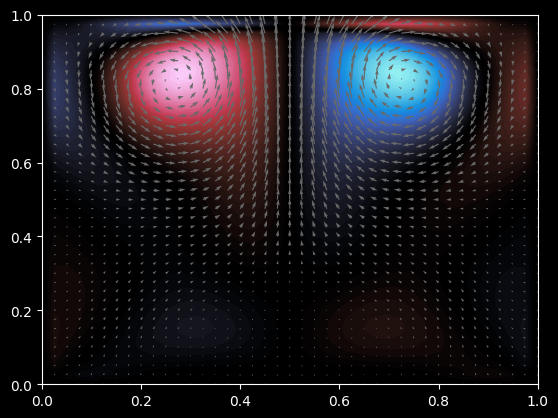

 95%|█████████▌| 95/100 [01:11<00:03,  1.28it/s]

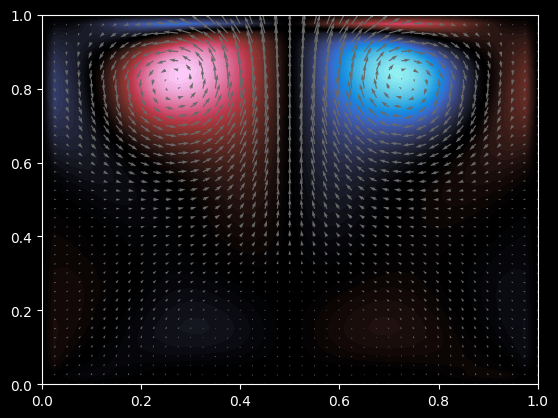

 96%|█████████▌| 96/100 [01:12<00:03,  1.32it/s]

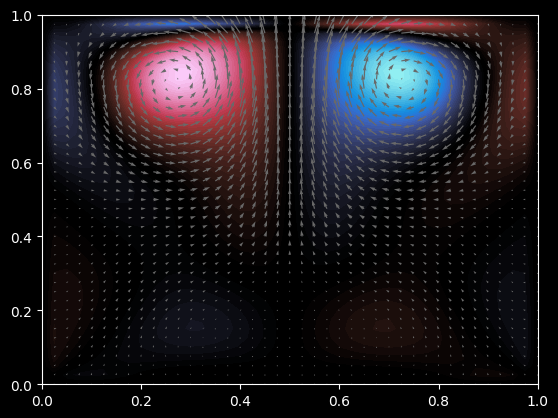

 97%|█████████▋| 97/100 [01:13<00:02,  1.33it/s]

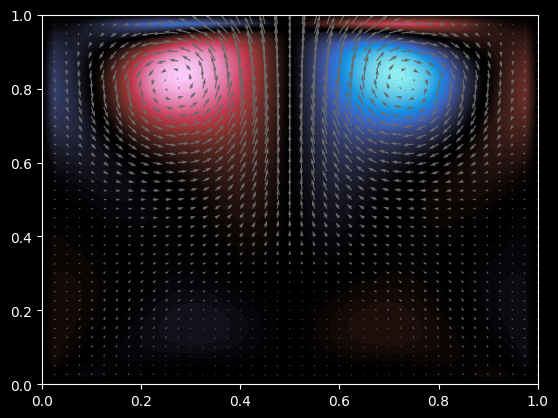

 98%|█████████▊| 98/100 [01:14<00:01,  1.29it/s]

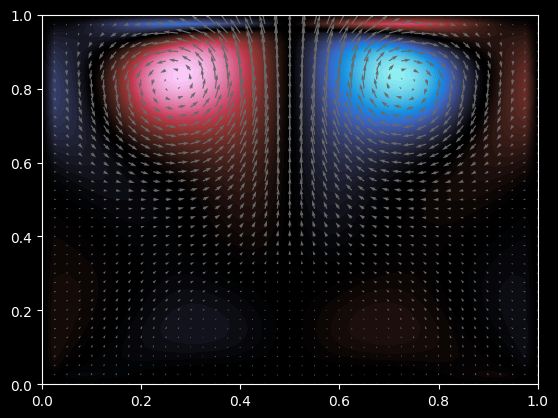

 99%|█████████▉| 99/100 [01:14<00:00,  1.32it/s]

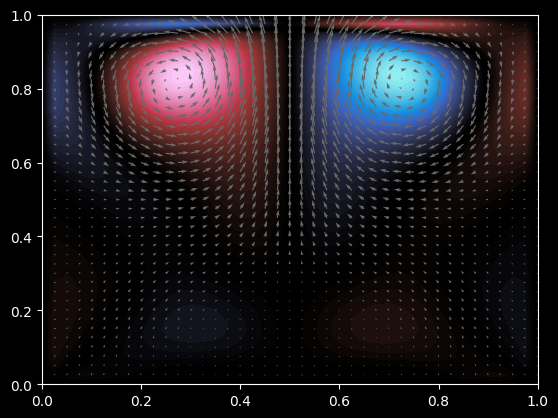

100%|██████████| 100/100 [01:15<00:00,  1.32it/s]


<Figure size 640x480 with 0 Axes>

In [49]:
main()